<a href="https://colab.research.google.com/github/swarathesh/Auto-Comic-Translation/blob/master/comic_translation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 59 not upgraded.


In [5]:
import pytesseract
from pytesseract import Output

import shutil
import os
import random
try:
 from PIL import Image
except ImportError:
 import Image
import matplotlib.pyplot as plt
import cv2

In [6]:
from google.colab.patches import cv2_imshow

In [7]:
def display(image):
 cv2_imshow( image)
 cv2.waitKey(0)

In [8]:
image = cv2.imread('image.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


In [9]:
# display(dilate)

# load and convert image to RGB format.

In [10]:
results = pytesseract.image_to_data(gray, output_type=Output.DICT)

# mask the text with blanks 

In [12]:
import cv2

image = cv2.imread('image.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,3))
close = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, close_kernel, iterations=1)

dilate_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,3))
dilate = cv2.dilate(close, dilate_kernel, iterations=1)

cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv2.contourArea(c)

    if  area > 7.0 and area <1619839.0:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x + w, y + h), (255,255,255), -1)
cv2.imwrite('image2.jpg',image)

True

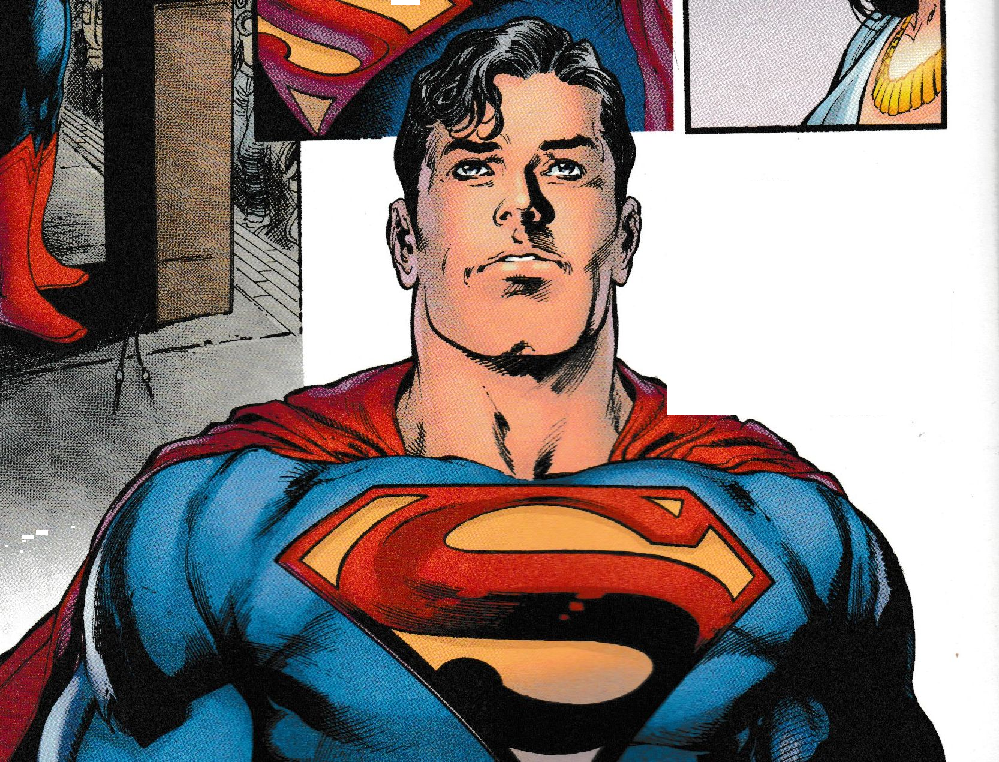

In [13]:
display(image)

In [47]:
!pip install googletrans


     |████████████████████████████████| 61kB 4.2MB/s 
     |████████████████████████████████| 51kB 6.4MB/s 
     |████████████████████████████████| 901kB 15.0MB/s 
     |████████████████████████████████| 71kB 9.4MB/s 
     |████████████████████████████████| 61kB 9.3MB/s 
     |████████████████████████████████| 102kB 12.3MB/s 
  Created wheel for googletrans: filename=googletrans-3.0.0-cp36-none-any.whl size=15736 sha256=897533277013cfb9f129d4a7b115d1baed8846c1b2e0950e30f0214f7aa6448f
  Stored in directory: /root/.cache/pip/wheels/28/1a/a7/eaf4d7a3417a0c65796c547cff4deb6d79c7d14c2abd29273e
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7666 sha256=f758054de710484aa78c34276b3515ad754f633d4566bf033c276502c697529c
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
Successfully built googletrans contextvars


In [52]:
from googletrans import Translator
translator = Translator()
translator.translate('안녕하세요.', dest='ja').text


'こんにちは。'

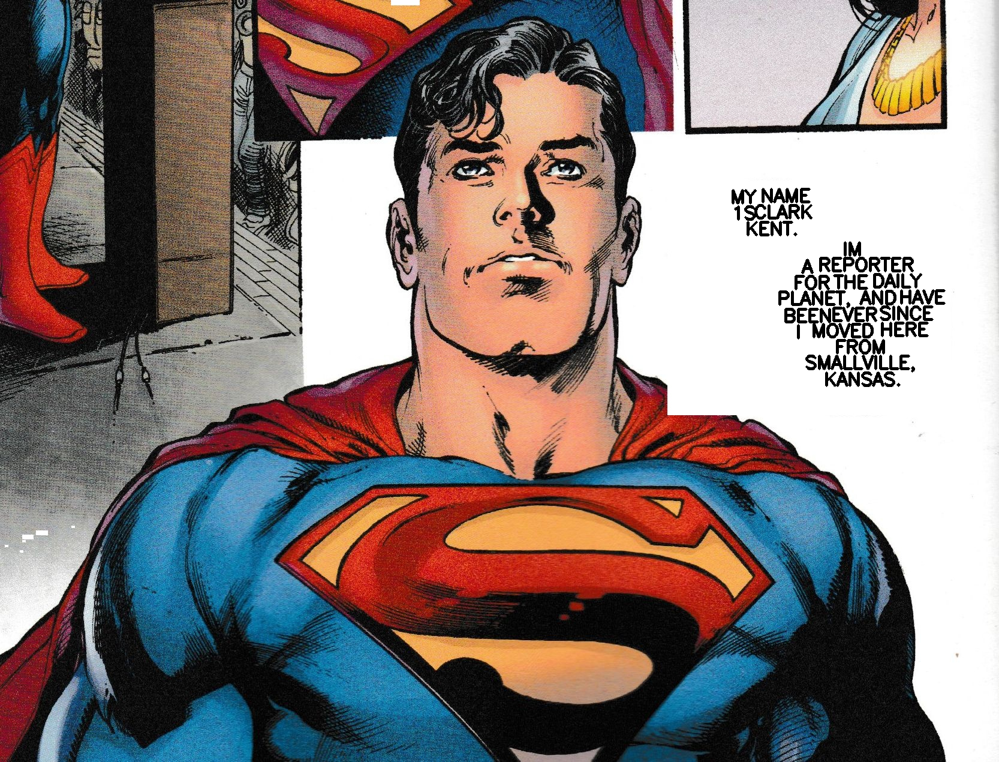

In [56]:
image2 = cv2.imread('image2.jpg')

for i in range(0, len(results["text"])):
	# extract the bounding box coordinates of the text region from
	# the current result
	x = results["left"][i]
	y = results["top"][i]
	w = results["width"][i]
	h = results["height"][i]
 

	text = results["text"][i]
	conf = int(results["conf"][i])


	if conf > 10  :
		# strip out non-ASCII text so we can draw the text on the image
		# using OpenCV, then draw a bounding box around the text along
		# with the text itself
    
		text = "".join([c if ord(c) < 128 else "" for c in text]).strip()
   
  
    

		
		cv2.putText(image2, text, (x, y+2 ), cv2.FONT_HERSHEY_SIMPLEX,
			1, (0, 0, 0), 3)
display(image2)    

In [60]:
def translate(word):
  return translator.translate(word, dest='fr').text

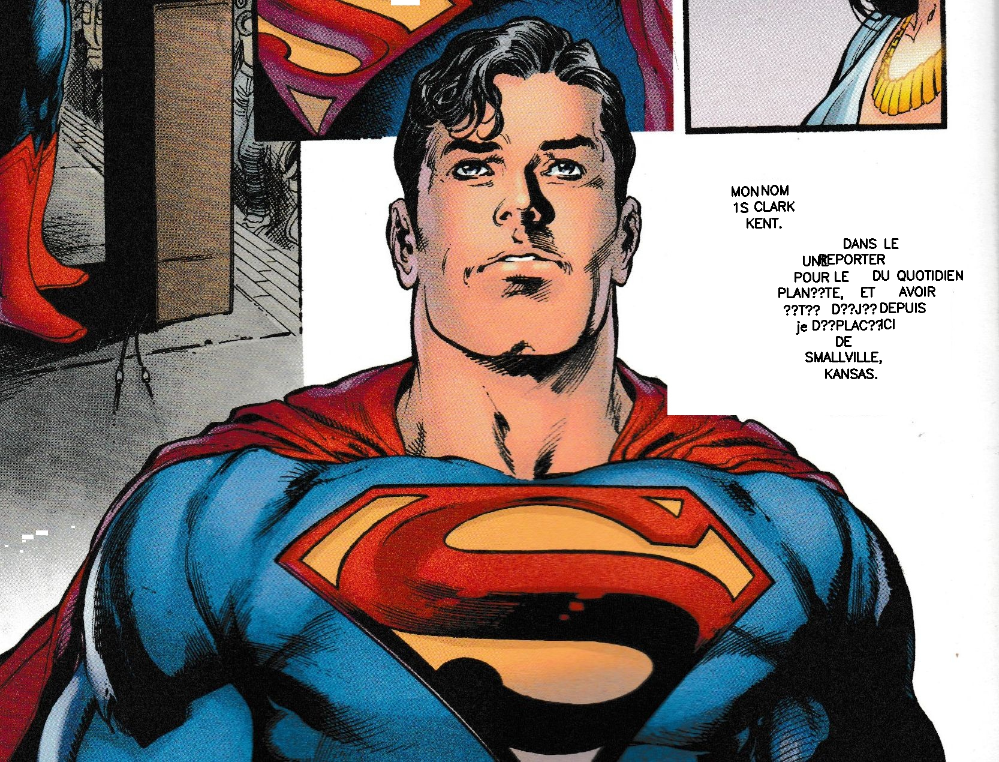

In [69]:
image2 = cv2.imread('image2.jpg')

for i in range(0, len(results["text"])):
	# extract the bounding box coordinates of the text region from
	# the current result
	x = results["left"][i]
	y = results["top"][i]
	w = results["width"][i]
	h = results["height"][i]
 

	text = results["text"][i]
	conf = int(results["conf"][i])


	if conf > 10  :
		# strip out non-ASCII text so we can draw the text on the image
		# using OpenCV, then draw a bounding box around the text along
		# with the text itself
    
		text = translate("".join([c if ord(c) < 128 else "" for c in text]).strip())
    
   
    # text = gs.translate(text,'fr')
  
    

	
		cv2.putText(image2, text, (x, y-10 ), cv2.FONT_HERSHEY_SIMPLEX,
			0.7, (0, 0, 0), 2)
display(image2)    